# 1. The Problem Without Tools
When users ask Claude for current information, it hits a wall. For example, if someone asks "What's the weather in San Francisco, California?" Claude has to respond with something like "I'm sorry, but I don't have access to up-to-date weather information."

### How Tool Use Works

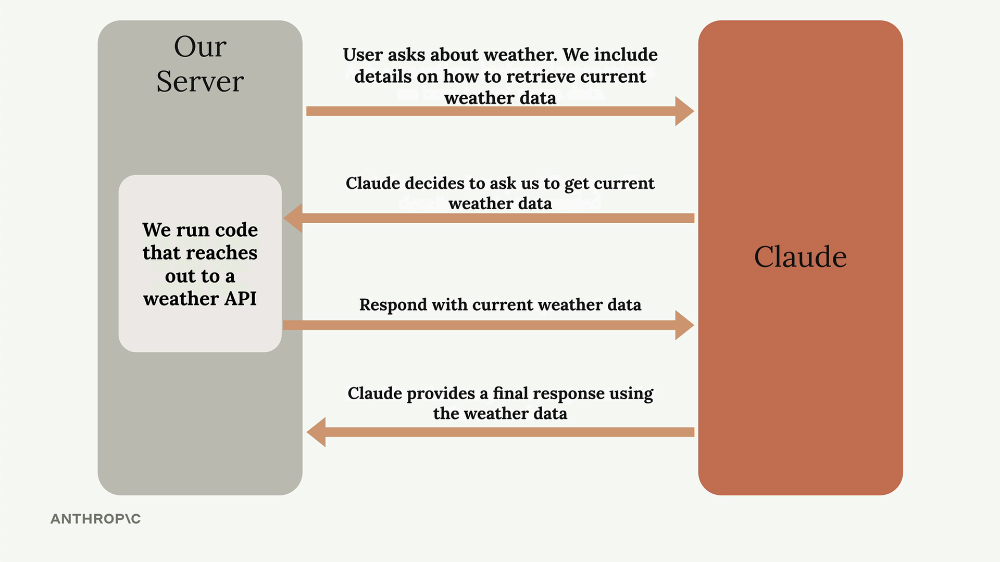
1. **Initial Request:** You send Claude a question along with instructions on how to get extra data from external sources
2. **Tool Request:** Claude analyzes the question and decides it needs additional information, then asks for specific details about what data it needs
3. **Data Retrieval:** Your server runs code to fetch the requested information from external APIs or databases
4. **Final Response:** You send the retrieved data back to Claude, which then generates a complete response using both the original question and the fresh data

# 2. Tool Functions

We're going to build a practical project that teaches Claude how to set reminders for future dates. This might sound simple at first, but it reveals several interesting challenges that we'll solve using custom tools.

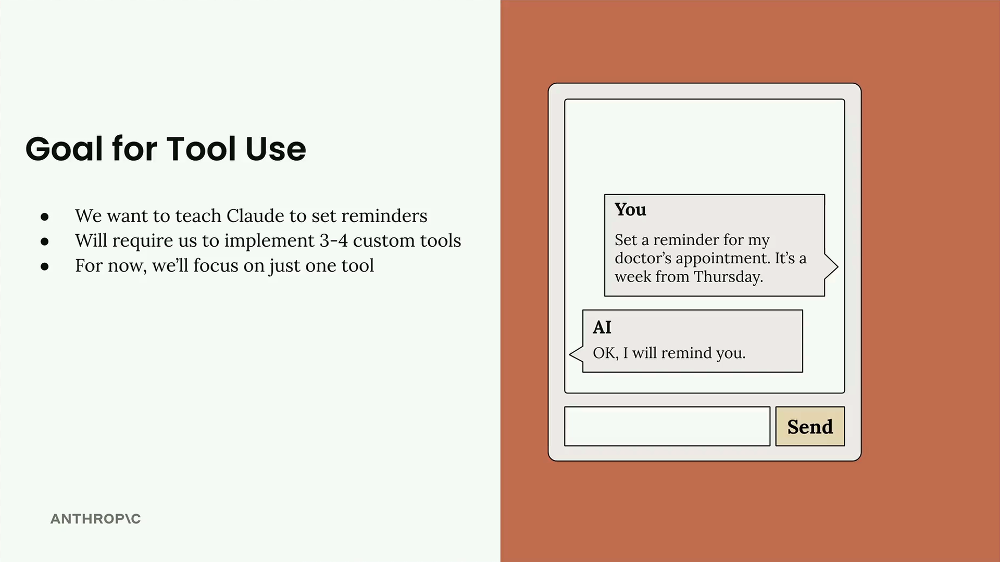

**While Claude knows the current date, there are three specific problems we need to solve:**

* **Limited time awareness:** Claude might know the current date, but not the exact time
* **Date calculation issues:** Claude doesn't always handle time-based addition well, especially when looking many days into the future
* **No reminder capability:** Claude doesn't know how to set a reminder - it has no built-in mechanism for this

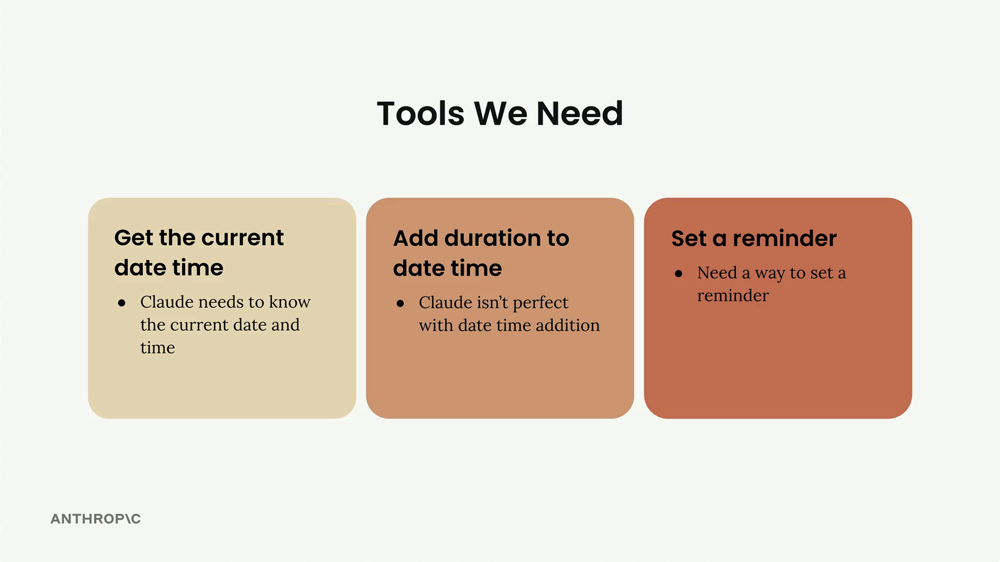

The image above shows three essential tools we'll be implementing: getting the current date/time, adding duration to dates, and setting reminders. Let's start with the first one.

In [1]:
# Load env variables and create client
from dotenv import load_dotenv
from anthropic import Anthropic

load_dotenv()

client = Anthropic()
model = "claude-haiku-4-5"

In [ ]:
# Helper functions
def add_user_message(messages, text):
    user_message = {"role": "user", "content": text}
    messages.append(user_message)


def add_assistant_message(messages, text):
    assistant_message = {"role": "assistant", "content": text}
    messages.append(assistant_message)


def chat(messages, system=None, temperature=1.0, stop_sequences=[]):
    params = {
        "model": model,
        "max_tokens": 1000,
        "messages": messages,
        "temperature": temperature,
        "stop_sequences": stop_sequences,
    }

    if system:
        params["system"] = system

    message = client.messages.create(**params)
    return message.content[0].text

In [ ]:
# Tools and Schemas

from datetime import datetime, timedelta


def add_duration_to_datetime(
    datetime_str, duration=0, unit="days", input_format="%Y-%m-%d"
):
    date = datetime.strptime(datetime_str, input_format)

    if unit == "seconds":
        new_date = date + timedelta(seconds=duration)
    elif unit == "minutes":
        new_date = date + timedelta(minutes=duration)
    elif unit == "hours":
        new_date = date + timedelta(hours=duration)
    elif unit == "days":
        new_date = date + timedelta(days=duration)
    elif unit == "weeks":
        new_date = date + timedelta(weeks=duration)
    elif unit == "months":
        month = date.month + duration
        year = date.year + month // 12
        month = month % 12
        if month == 0:
            month = 12
            year -= 1
        day = min(
            date.day,
            [
                31,
                29 if year % 4 == 0 and (year % 100 != 0 or year % 400 == 0) else 28,
                31,
                30,
                31,
                30,
                31,
                31,
                30,
                31,
                30,
                31,
            ][month - 1],
        )
        new_date = date.replace(year=year, month=month, day=day)
    elif unit == "years":
        new_date = date.replace(year=date.year + duration)
    else:
        raise ValueError(f"Unsupported time unit: {unit}")

    return new_date.strftime("%A, %B %d, %Y %I:%M:%S %p")


def set_reminder(content, timestamp):
    print(f"----\nSetting the following reminder for {timestamp}:\n{content}\n----")


add_duration_to_datetime_schema = {
    "name": "add_duration_to_datetime",
    "description": "Adds a specified duration to a datetime string and returns the resulting datetime in a detailed format. This tool converts an input datetime string to a Python datetime object, adds the specified duration in the requested unit, and returns a formatted string of the resulting datetime. It handles various time units including seconds, minutes, hours, days, weeks, months, and years, with special handling for month and year calculations to account for varying month lengths and leap years. The output is always returned in a detailed format that includes the day of the week, month name, day, year, and time with AM/PM indicator (e.g., 'Thursday, April 03, 2025 10:30:00 AM').",
    "input_schema": {
        "type": "object",
        "properties": {
            "datetime_str": {
                "type": "string",
                "description": "The input datetime string to which the duration will be added. This should be formatted according to the input_format parameter.",
            },
            "duration": {
                "type": "number",
                "description": "The amount of time to add to the datetime. Can be positive (for future dates) or negative (for past dates). Defaults to 0.",
            },
            "unit": {
                "type": "string",
                "description": "The unit of time for the duration. Must be one of: 'seconds', 'minutes', 'hours', 'days', 'weeks', 'months', or 'years'. Defaults to 'days'.",
            },
            "input_format": {
                "type": "string",
                "description": "The format string for parsing the input datetime_str, using Python's strptime format codes. For example, '%Y-%m-%d' for ISO format dates like '2025-04-03'. Defaults to '%Y-%m-%d'.",
            },
        },
        "required": ["datetime_str"],
    },
}

set_reminder_schema = {
    "name": "set_reminder",
    "description": "Creates a timed reminder that will notify the user at the specified time with the provided content. This tool schedules a notification to be delivered to the user at the exact timestamp provided. It should be used when a user wants to be reminded about something specific at a future point in time. The reminder system will store the content and timestamp, then trigger a notification through the user's preferred notification channels (mobile alerts, email, etc.) when the specified time arrives. Reminders are persisted even if the application is closed or the device is restarted. Users can rely on this function for important time-sensitive notifications such as meetings, tasks, medication schedules, or any other time-bound activities.",
    "input_schema": {
        "type": "object",
        "properties": {
            "content": {
                "type": "string",
                "description": "The message text that will be displayed in the reminder notification. This should contain the specific information the user wants to be reminded about, such as 'Take medication', 'Join video call with team', or 'Pay utility bills'.",
            },
            "timestamp": {
                "type": "string",
                "description": "The exact date and time when the reminder should be triggered, formatted as an ISO 8601 timestamp (YYYY-MM-DDTHH:MM:SS) or a Unix timestamp. The system handles all timezone processing internally, ensuring reminders are triggered at the correct time regardless of where the user is located. Users can simply specify the desired time without worrying about timezone configurations.",
            },
        },
        "required": ["content", "timestamp"],
    },
}

batch_tool_schema = {
    "name": "batch_tool",
    "description": "Invoke multiple other tool calls simultaneously",
    "input_schema": {
        "type": "object",
        "properties": {
            "invocations": {
                "type": "array",
                "description": "The tool calls to invoke",
                "items": {
                    "type": "object",
                    "properties": {
                        "name": {
                            "type": "string",
                            "description": "The name of the tool to invoke",
                        },
                        "arguments": {
                            "type": "string",
                            "description": "The arguments to the tool, encoded as a JSON string",
                        },
                    },
                    "required": ["name", "arguments"],
                },
            }
        },
        "required": ["invocations"],
    },
}

pass

#### What are Tool Functions?

**A tool function is a plain Python function that gets executed automatically when Claude decides it needs extra information to help a user.**  
For example, if someone asks "What time is it?", Claude would call your date/time tool to get the current time.

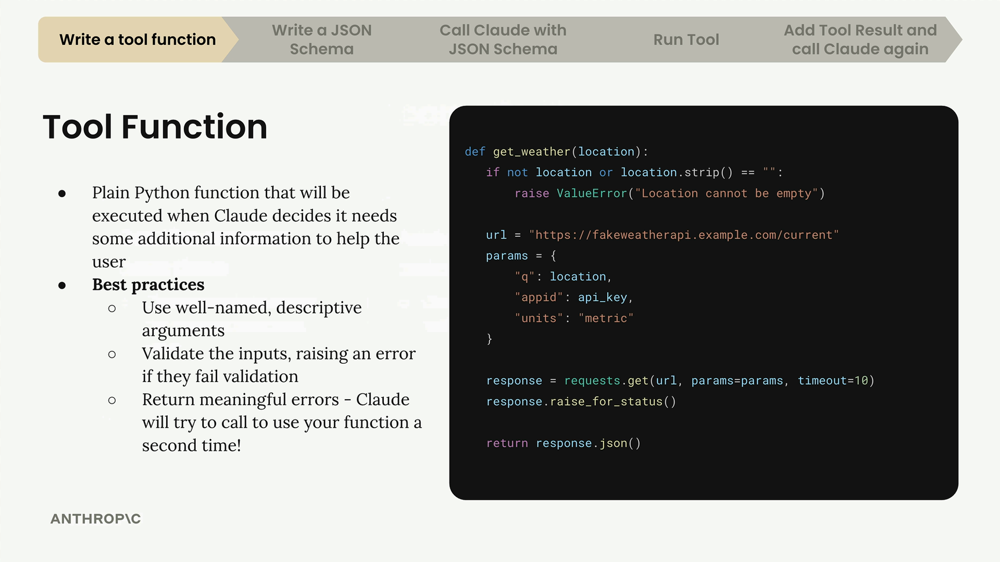

* Here's an example of a weather tool function. Notice how it validates inputs and provides clear error messages - these are important best practices.

# 3. Tool Schemas
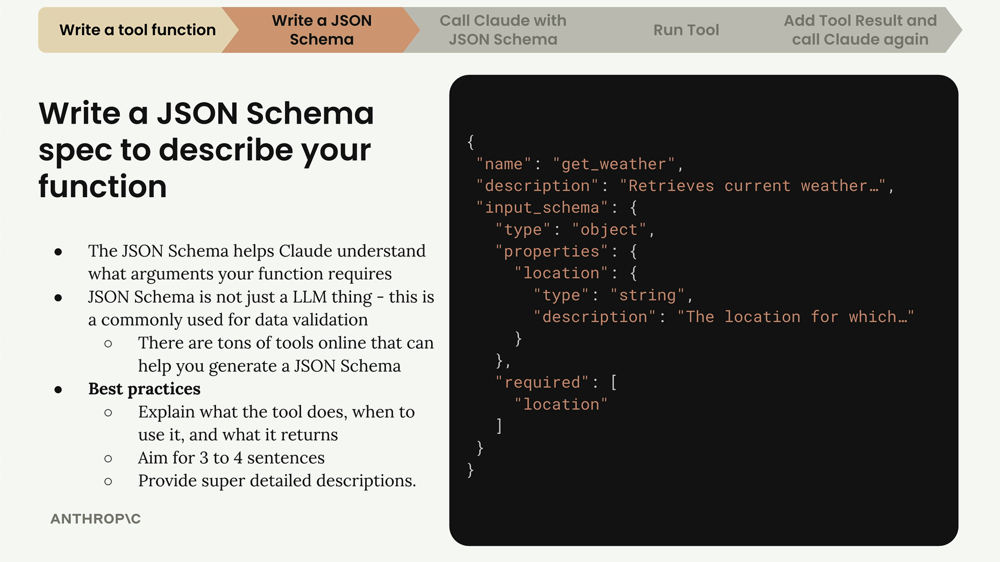

The complete tool specification has three main parts:

* **name** - A clear, descriptive name for your tool (like "get_weather")
* **description** - What the tool does, when to use it, and what it returns
* **input_schema** - The actual JSON schema describing the function's arguments

#### Writing Effective Descriptions

Your tool description is crucial for helping Claude understand when to use your function. Best practices include:

* Aim for 3-4 sentences explaining what the tool does
* Describe when Claude should use it
* Explain what kind of data it returns
* Provide detailed descriptions for each argument

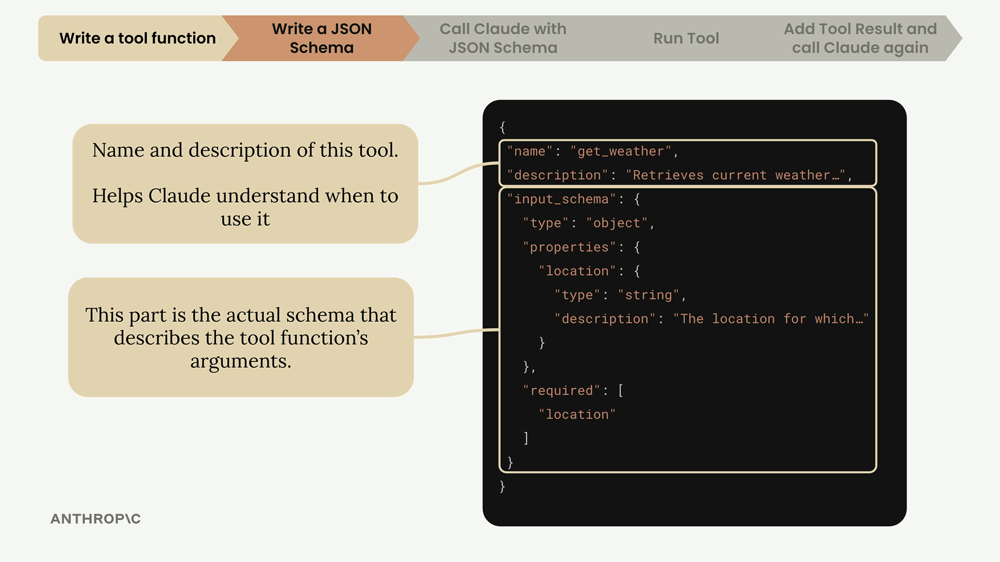

### Generate Schemas
Instead of writing JSON schemas from scratch, you can use Claude itself to generate them. Here's the process:

1. Copy your tool function code
2. Go to Claude and ask it to write a JSON schema for tool calling
3. Include the Anthropic documentation on tool use as context
4. Let Claude generate a properly formatted schema following best practices

The prompt should be something like: 
```
"Write a valid JSON schema spec for the purposes of tool calling for this function. Follow the best practices listed in the attached documentation."
```

#### Implementing the Schema in Code
Once Claude generates your schema, copy it into your code file. Here's a good naming pattern to follow:

In [ ]:
def get_current_datetime(date_format="%Y-%m-%d %H:%M:%S"):
    if not date_format:
        raise ValueError("date_format cannot be empty")
    return datetime.now().strftime(date_format)

get_current_datetime_schema = {
    "name": "get_current_datetime",
    "description": "Returns the current date and time formatted according to the specified format",
    "input_schema": {
        "type": "object",
        "properties": {
            "date_format": {
                "type": "string",
                "description": "A string specifying the format of the returned datetime. Uses Python's strftime format codes.",
                "default": "%Y-%m-%d %H:%M:%S"
            }
        },
        "required": []
    }
}

Use the pattern of `function_name` followed by `function_name_schema` to keep your schemas organized and easy to match with their corresponding functions.

#### Adding Type Safety
For better type checking, import and use the `ToolParam` type from the Anthropic library. While not strictly necessary for functionality, this prevents type errors when you use the schema with Claude's API and makes your code more robust.

In [ ]:
from anthropic.types import ToolParam

get_current_datetime_schema = ToolParam({
    "name": "get_current_datetime",
    "description": "Returns the current date and time formatted according to the specified format",
    # ... rest of schema
})

# 4. Making Tool Enabled API Calls

To enable Claude to use tools, you need to include a `tools` parameter in your API call. Here's how to structure the request. The tools parameter takes a list of JSON schemas that describe the available functions Claude can call.

In [ ]:
messages = []
messages.append({
    "role": "user",
    "content": "What is the exact time, formatted as HH:MM:SS?"
})

response = client.messages.create(
    model=model,
    max_tokens=1000,
    messages=messages,
    tools=[get_current_datetime_schema],
)

### Understanding Multi-block messages

When Claude decides to use a tool, it returns an assistant message with multiple blocks in the content list. This is a significant change from the simple text-only responses you've worked with before.

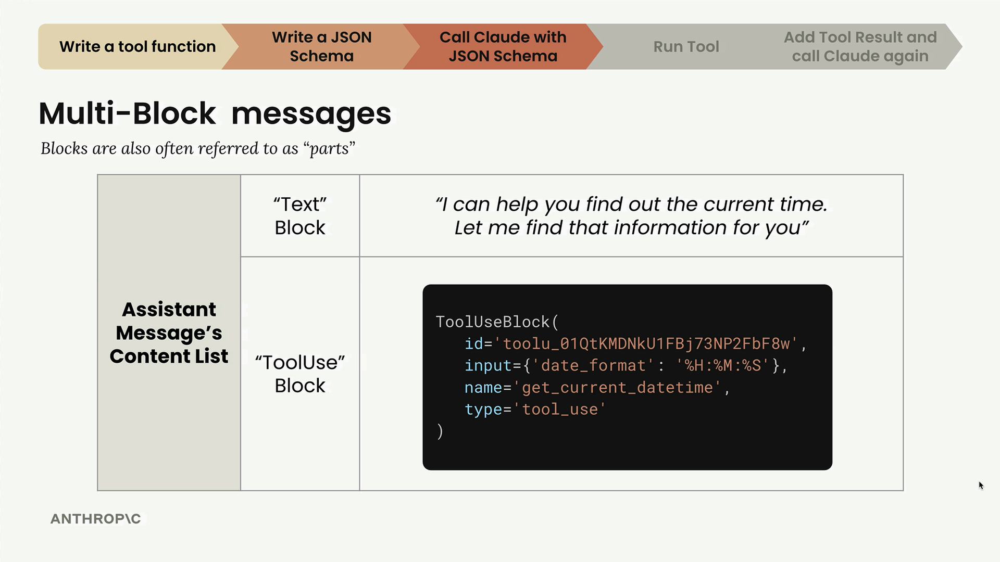

A multi-block message typically contains:

1. Text Block - Human-readable text explaining what Claude is doing (like "I can help you find out the current time. Let me find that information for you")
2. ToolUse Block - Instructions for your code about which tool to call and what parameters to use

The ToolUse block includes:

4. An ID for tracking the tool call
5. The name of the function to call (like "get_current_datetime")
6. Input parameters formatted as a dictionary
7. The type designation "tool_use"

#### Managing Conversation History with Multi-Block Messages

Remember that Claude doesn't store conversation history - you need to manage it manually. When working with tool responses, you must preserve the entire content structure, including all blocks.

Here's how to properly append a multi-block assistant message to your conversation history:

In [ ]:
messages.append({
    "role": "assistant",
    "content": response.content
})

### The Complete Tool Usage Flow

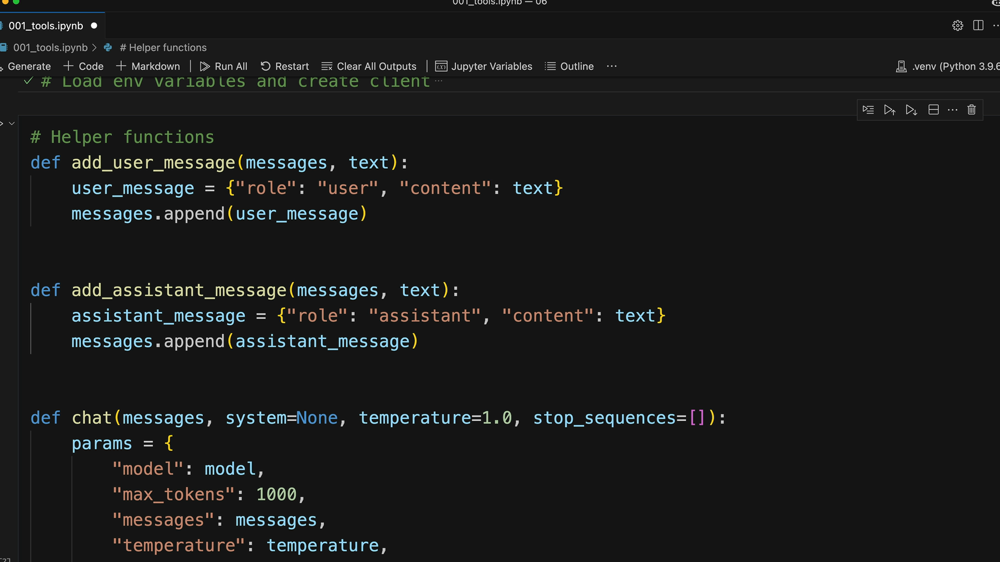

The tool usage process follows this pattern:

1. Send user message with tool schema to Claude
2. Receive assistant message with text block and tool use block
3. Extract tool information and execute the actual function
4. Send tool result back to Claude along with complete conversation history
5. Receive final response from Claude

Each step requires careful handling of the message structure to ensure Claude has the full context it needs to provide accurate responses.

If you've been using helper functions like `add_user_message()` and `add_assistant_message()`, you'll need to update them to handle multi-block content. The current versions likely only support single text blocks, but now they need to accommodate the more complex content structures that include tool use blocks.

# 5. Multi-Turn Conversations with Tools

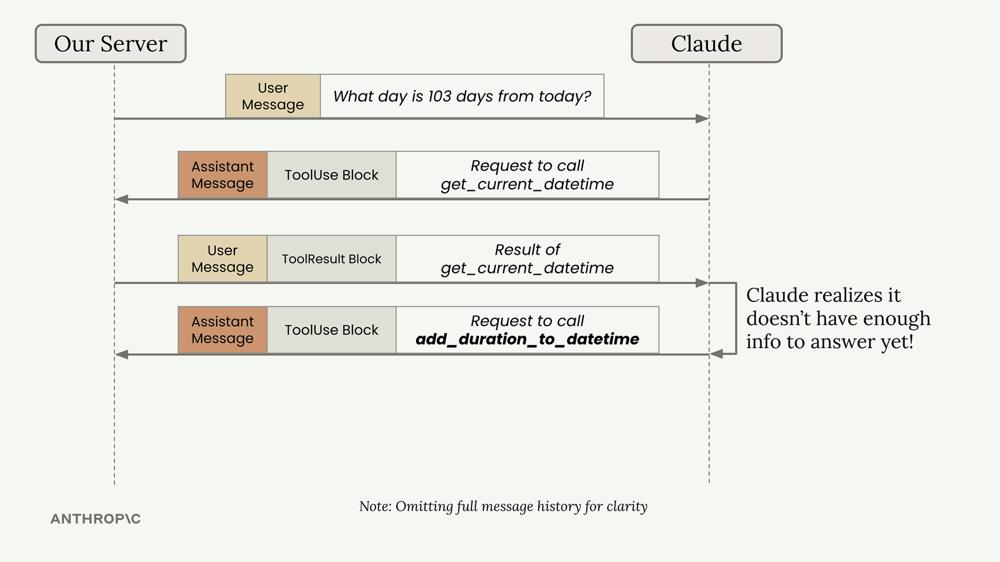

When building applications with **multiple tools**, you need to handle scenarios where Claude might need to call several tools in sequence to answer a single user question. For example, if a user asks "What day is 103 days from today?", Claude needs to first get the current date, then add 103 days to it.

This creates a **multi-turn conversation pattern** where Claude makes multiple tool requests before providing a final answer. **Your application needs to handle this automatically**.

## Multi-Turn Tool Pattern

Here's what happens behind the scenes when Claude needs multiple tools:

1. User asks: `"What day is 103 days from today?"`
2. Claude responds with a tool use block requesting get_current_datetime
3. **Your server calls the function** and returns the result
4. Claude realizes it needs more information and requests add_duration_to_datetime
5. **Your server calls** that function and returns the result
6. Claude now has enough information to provide the final answer


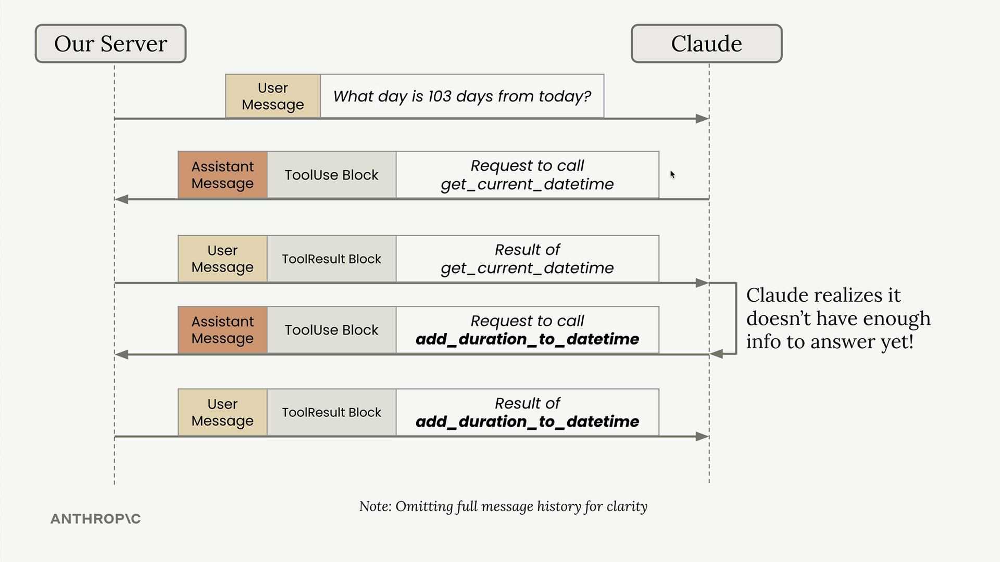

#### Building a Conversation Loop

To handle this pattern, you need a conversation loop that continues until Claude stops requesting tools:

In [ ]:
def run_conversation(messages):
    while True:
        response = chat(messages)

        add_assistant_message(messages, response)

        # Pseudo code
        if response isn't asking for a tool:
            break

        tool_result_blocks = run_tools(response)
        add_user_message(messages, tool_result_blocks)
        
    return messages

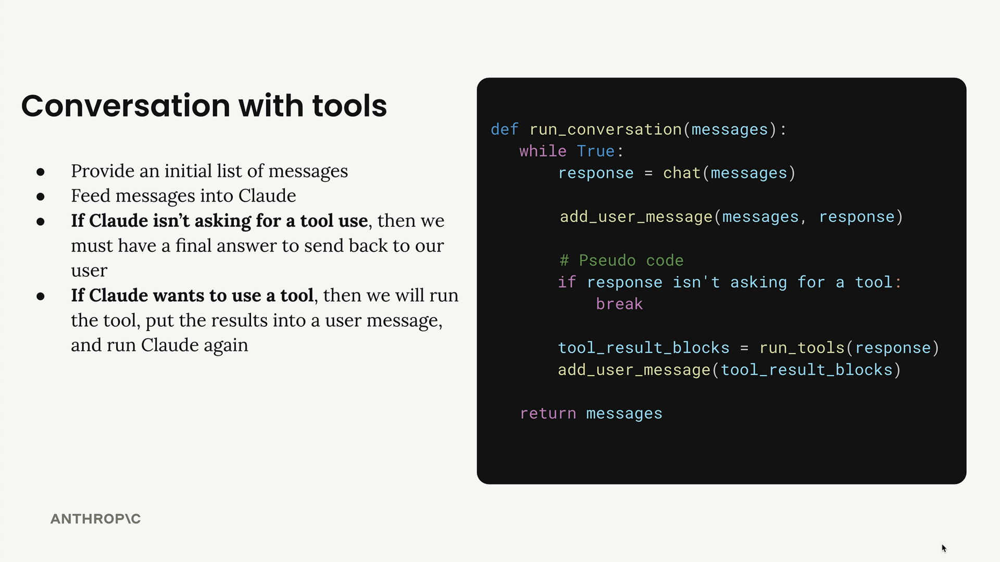

### Refactoring Helper Functions - New Changes to Them!

Before implementing the conversation loop, you need to update your helper functions to handle multiple message blocks properly.

#### Updating Message Handlers
Your `add_user_message()` and `add_assistant_message()` functions currently assume you're always working with plain text. Update them to handle full message objects as shown below.


In [ ]:
from anthropic.types import Message

def add_user_message(messages, message):
    user_message = {
        "role": "user",
        "content": message.content if isinstance(message, Message) else message
    }
    messages.append(user_message)

#### Updating the Chat Function
Modify your `chat()` function to accept a list of tools and return the full message instead of just text.

In [ ]:
def chat(messages, system=None, temperature=1.0, stop_sequences=[], tools=None):
    params = {
        "model": model,
        "max_tokens": 1000,
        "messages": messages,
        "temperature": temperature,
        "stop_sequences": stop_sequences,
    }
    
    if tools:
        params["tools"] = tools
        
    if system:
        params["system"] = system
        
    message = client.messages.create(**params)
    return message

#### Extracting Text from Messages Helper Function
Since you're now returning full message objects, create a helper to extract text when needed. This function finds all text blocks in a message and joins them together, which is useful when you need to display the final response to users.

In [ ]:
def text_from_message(message):
    return "\n".join(
        [block.text for block in message.content if block.type == "text"]
    )

### Key Improvements
These refactoring steps above prepare your code for robust tool handling!

* **Flexible message handling** - Your helper functions can now work with different message formats
* **Tool support in chat** - The chat function can receive and pass through tool schemas
* **Full message returns** - You get complete message objects instead of just text, preserving all blocks
* **Text extraction utility** - Easy way to get readable text from complex messages

# 6. Using Multiple Tools

Adding multiple tools to your Claude implementation becomes straightforward once you have the core tool-handling infrastructure in place.

Here's how to do it properly.

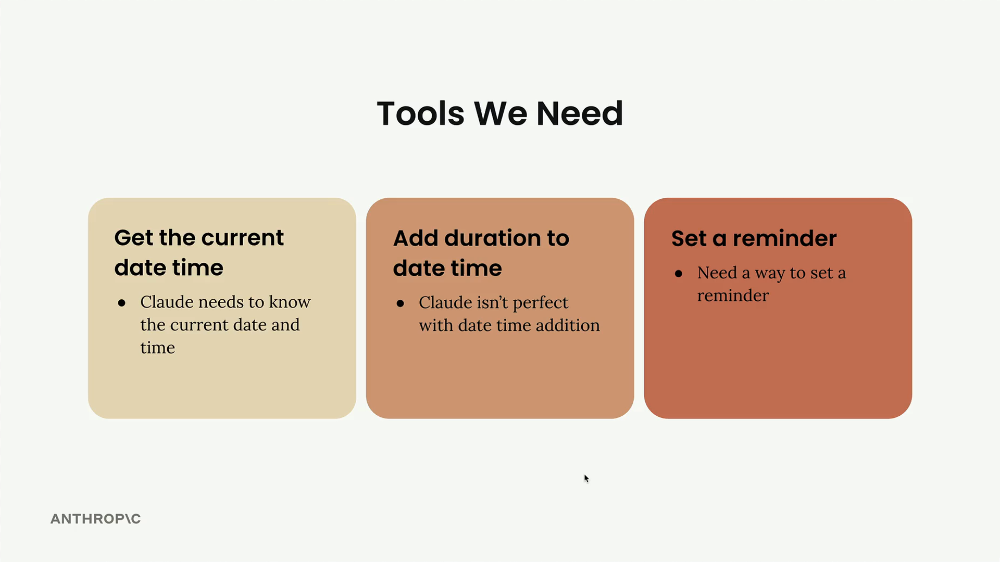

#### The Tools We Need to Add
1. **Get current date time** - Claude needs to know the current date and time
2. **Add duration to date time** - Claude isn't perfect with date time addition
3. **Set a reminder** - Need a way to set a reminder

The good news is that most of the implementation work is already done. The `add_duration_to_datetime()` function and `set_reminder()` function are provided, along with their corresponding schemas.

#### Adding Tools to the Conversation

First, update the run_conversation function to include the new tool schemas in the tools list. This tells Claude about all three available tools it can use during the conversation.

In [ ]:
response = chat(messages, tools=[
    get_current_datetime_schema,
    add_duration_to_datetime_schema,
    set_reminder_schema
])

This tells Claude about all three available tools it can use during the conversation.

#### Updating the ToolRouter

Next, modify the run_tool function to handle the new tool calls. Add elif cases for each new tool:

In [ ]:
def run_tool(tool_name, tool_input):
    if tool_name == "get_current_datetime":
        return get_current_datetime(**tool_input)
    elif tool_name == "add_duration_to_datetime":
        return add_duration_to_datetime(**tool_input)
    elif tool_name == "set_reminder":
        return set_reminder(**tool_input)

#### Testing Multiple Tool Usage
To test the system, try a request that requires multiple tools: "Set a reminder for my doctors appointment. Its 177 days after Jan 1st, 2050.

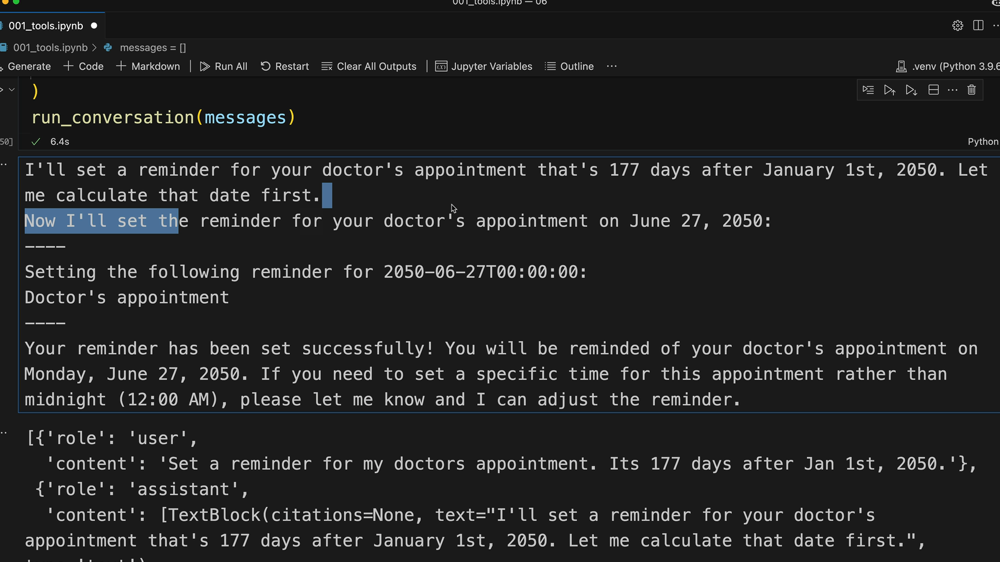

### The Simple Pattern for Adding Tools
Once you have the core tool infrastructure, adding new tools follows this pattern:

1. Create the tool function implementation
2. Define the tool schema
3. Add the schema to the tools list in **run_conversation**
4. Add a case for the tool in **run_tool**

This modular approach makes it easy to expand your AI assistant's capabilities without restructuring existing code. Each new tool integrates seamlessly with the existing conversation flow and tool-handling logic.

# 7. Basic Tool Streaming

With streaming enabled, Claude sends back different types of events as it processes your request. You're already familiar with events like ContentBlockDelta for regular text generation. 
* For tool use, you'll also need to handle a new event type called InputJsonEvent.

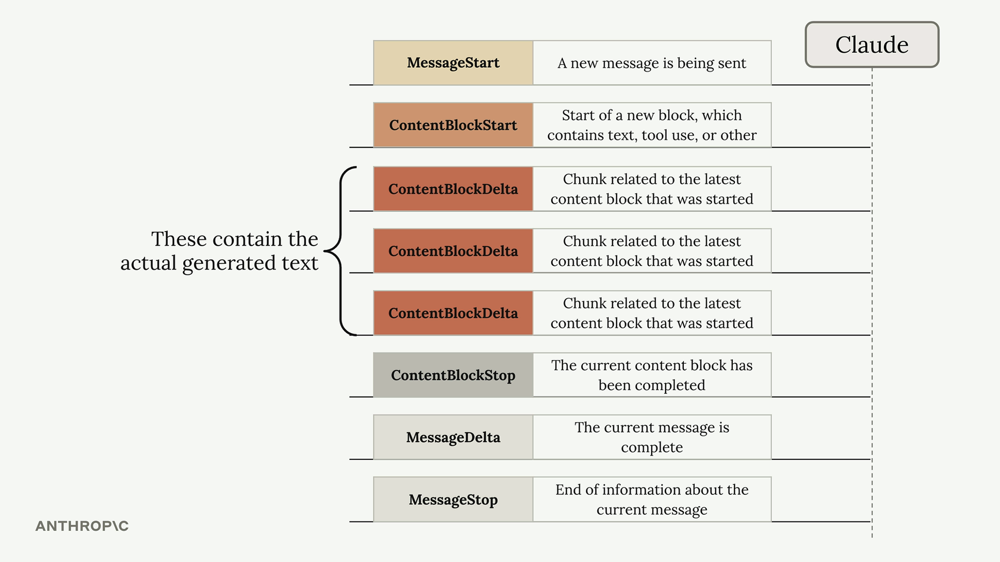

Each `InputJsonEvent()` contains two key properties:

* partial_json - A chunk of JSON representing part of the tool arguments
* snapshot - The cumulative JSON built up from all chunks received so far

In [ ]:
for chunk in stream:
    if chunk.type == "input_json":
        # Process the partial JSON chunk
        print(chunk.partial_json)
        # Or use the complete snapshot so far
        current_args = chunk.snapshot

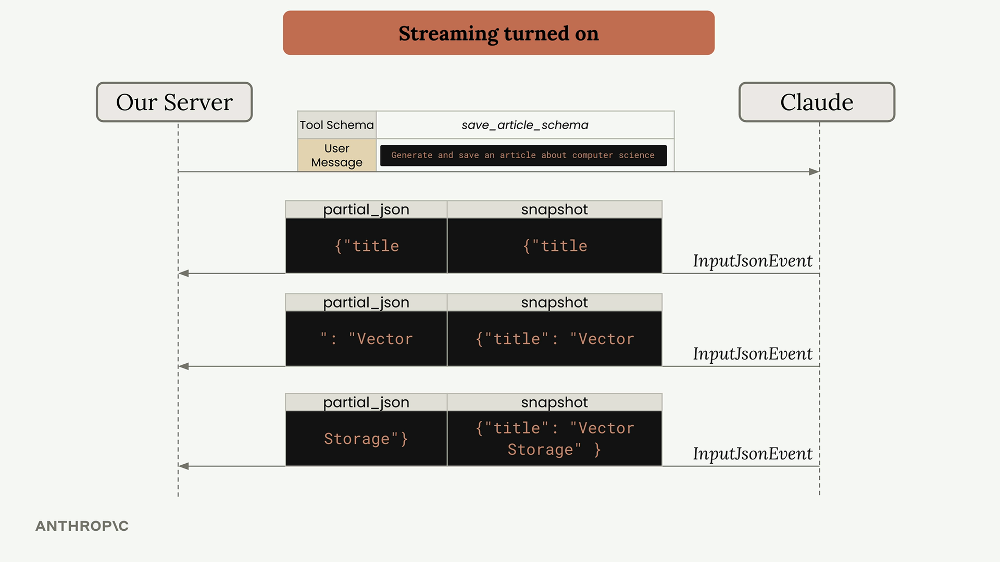

#### How JSON Validation Works

Here's where things get interesting. The Anthropic API doesn't immediately send you every chunk as Claude generates it. Instead, it buffers chunks and validates them first.

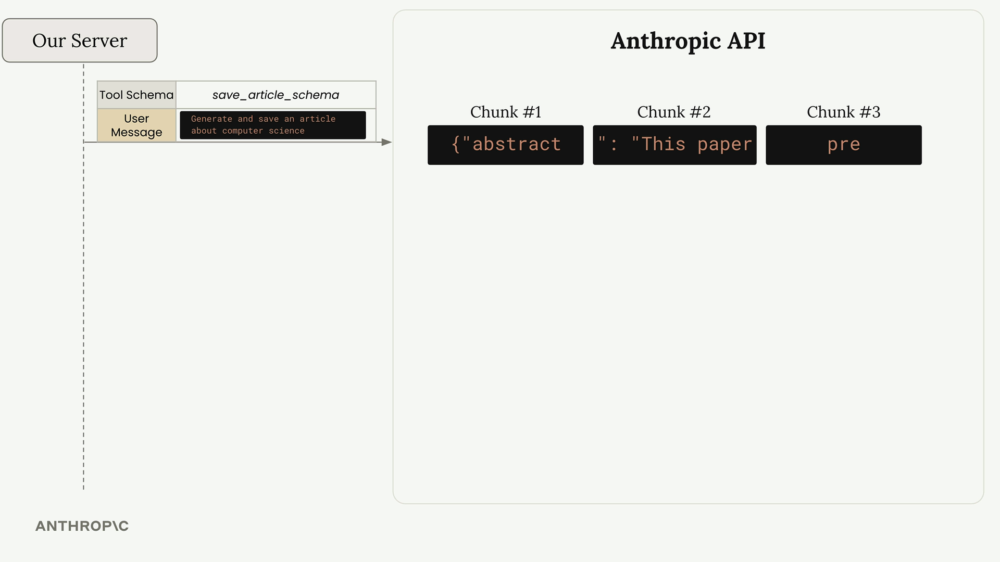

The API waits for complete top-level key-value pairs before sending anything. For example, if your tool expects this structure.

In [ ]:
{
  "abstract": "This paper presents a novel...",
  "meta": {
    "word_count": 847,
    "review": "This paper introduces QuanNet..."
  }
}

The API will:

1. Wait until the entire abstract value is complete
2. Validate that key-value pair against your schema
3. Send all the buffered chunks for abstract at once
4. Repeat the process for the meta object

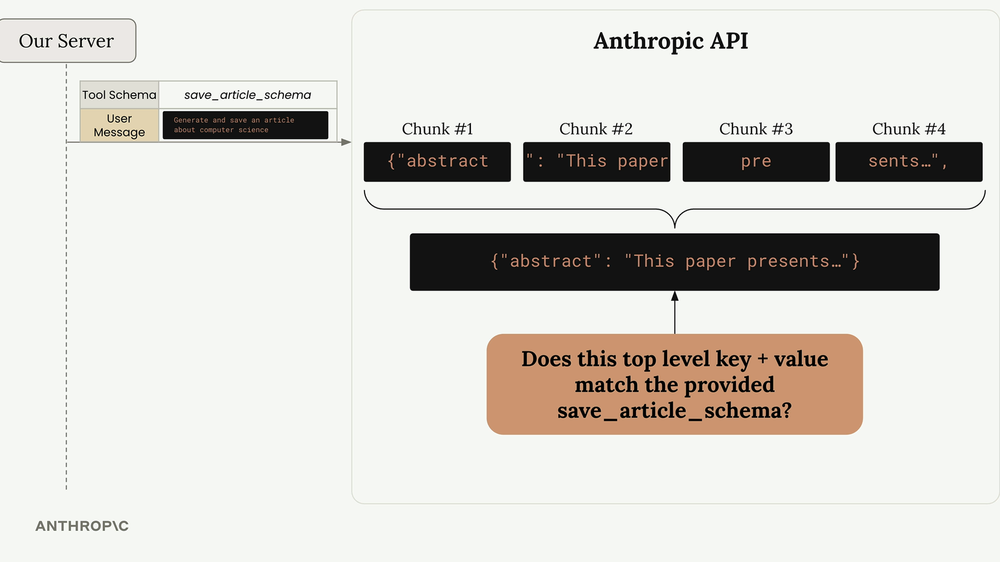

> This validation process explains why you see delays followed by bursts of text, even with streaming enabled. The chunks are being held back until a complete, valid top-level key-value pair is ready.

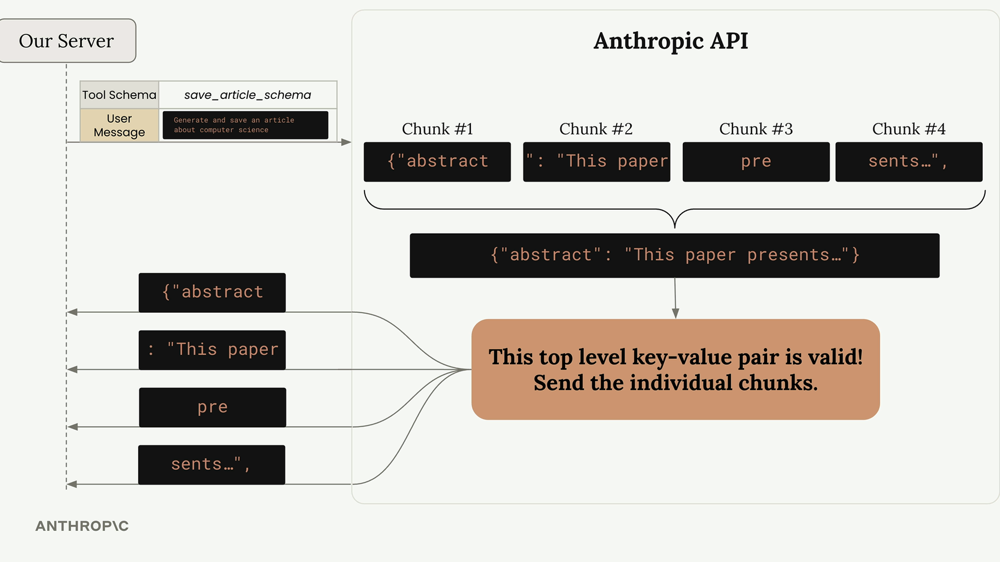

#### Fine-Grained Tool Calling


If you need faster, more granular streaming - perhaps to show users immediate updates or start processing partial results quickly - you can enable fine-grained tool calling.

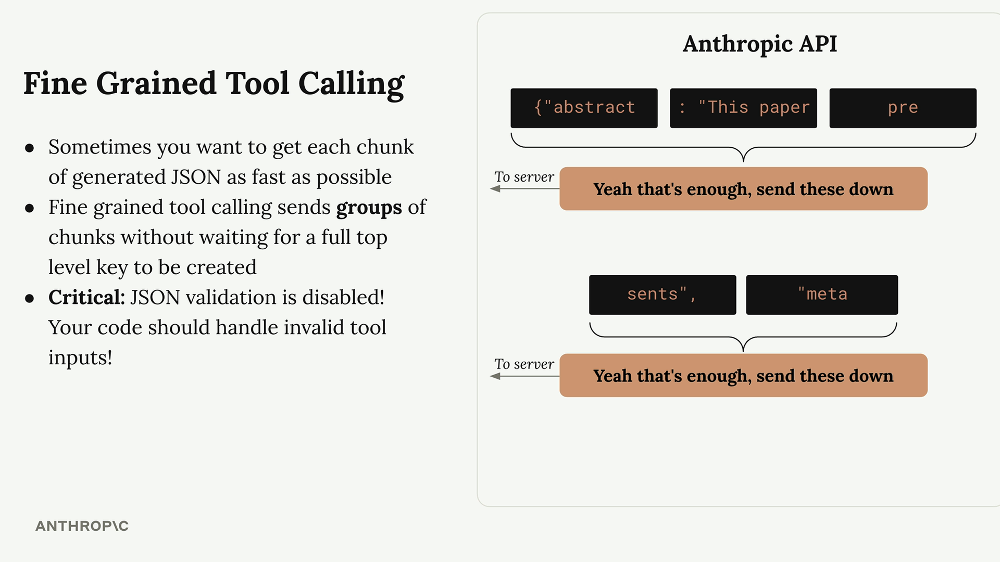

Fine-grained tool calling does one main thing: it disables JSON validation on the API side. This means:

* You get chunks as soon as Claude generates them
* No buffering delays between top-level keys
* More traditional streaming behavior
* Critical: JSON validation is disabled - your code must handle invalid JSON

Enable it by adding `fine_grained=True` to your API call:



In [ ]:
run_conversation(
    messages, 
    tools=[save_article_schema], 
    fine_grained=True
)

#### Handling Invalid JSON


When using fine-grained tool calling, Claude might generate invalid JSON like "word_count": undefined instead of a proper number. Your application needs to handle these cases gracefully:

In [ ]:
    parsed_args = json.loads(chunk.snapshot)
except json.JSONDecodeError:
    # Handle invalid JSON appropriately
    print("Received invalid JSON, continuing...")

Without fine-grained tool calling, the API's validation would catch this error and potentially wrap problematic values in strings, which might not match your expected schema.

# 8. Text Edit Tool

**IMPORTANT NOTE**:Tool version strings can for all model versions can be found here: https://docs.anthropic.com/en/docs/agents-and-tools/tool-use/text-editor-tool


Claude comes with one built-in tool that you don't need to create from scratch: the text editor tool. This tool gives Claude the ability to work with files and directories just like you would in a standard text editor.

### What the Text Editor Tool Can Do


The text editor tool provides Claude with a comprehensive set of file manipulation capabilities

1. View file or directory contents
2. View specific ranges of lines in a file
3. Replace text in a file
4. Create new files
5. Insert text at specific lines in a file
6. Undo recent edits to files

This dramatically expands Claude's abilities and essentially gives it the power to act as a software engineer right out of the gate.

### Understanding the Implementation Requirements


Here's where things get a bit confusing: while the tool schema is built into Claude, you still need to provide the actual implementation. Think of it this way - Claude knows how to ask for file operations, but you need to write the code that actually performs those operations.
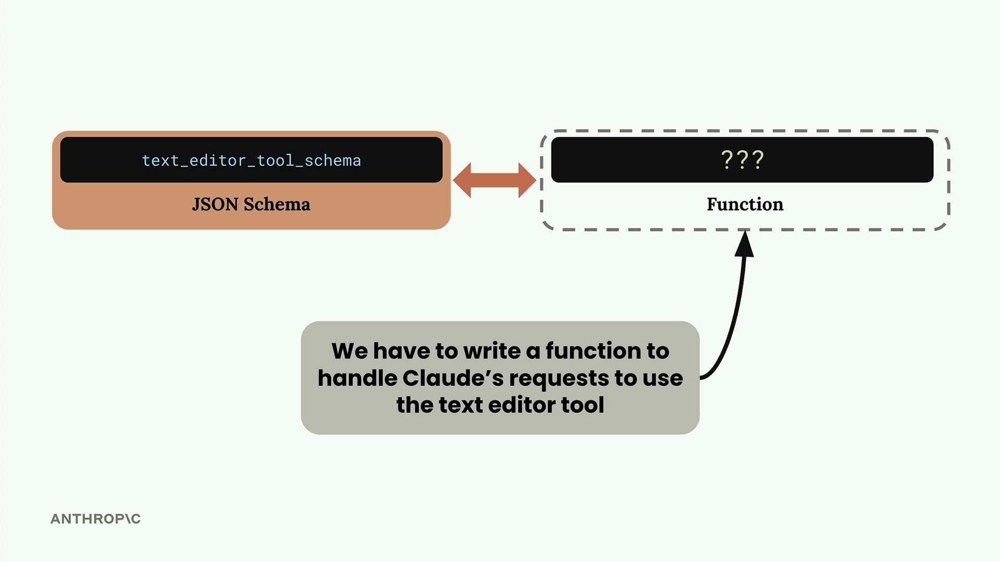

### Schema Versions
While the main schema is built into Claude, you do need to include a small schema stub when making requests. The exact schema depends on which Claude model you're using:

In [ ]:
def get_text_edit_schema(model):
    if model.startswith("claude-3-7-sonnet"):
        return {
            "type": "text_editor_20250124",
            "name": "str_replace_editor",
        }
    elif model.startswith("claude-3-5-sonnet"):
        return {
            "type": "text_editor_20241022", 
            "name": "str_replace_editor",
        }

# 9. Web Search Tool


Claude handles the entire search process automatically - you just need to provide a simple schema to enable it.

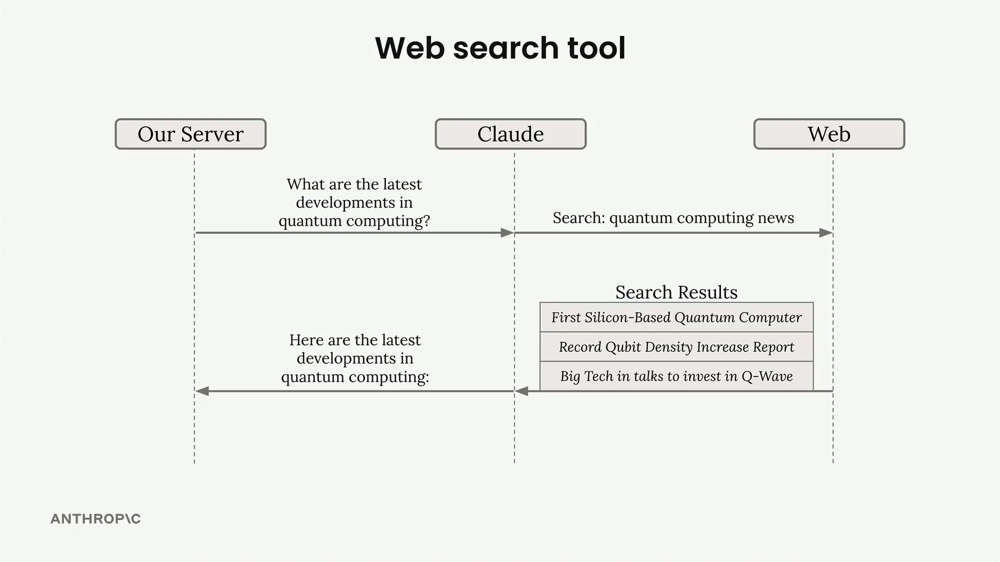

### Setting Up the Web Search Tool

To use the web search tool, you create a schema object with these required fields:

In [ ]:
web_search_schema = {
    "type": "web_search_20250305",
    "name": "web_search", 
    "max_uses": 5
}

The `max_uses` field **limits how many searches Claude can perform**. Claude might do follow-up searches based on initial results, so this prevents excessive API calls.

### How the Response Works

When Claude uses the web search tool, the response contains several types of blocks:

1. **Text blocks** - Claude's explanation of what it's doing
2. **ServerToolUseBlock** - Shows the exact search query Claude used
3. **WebSearchToolResultBlock** - Contains the search results
4. **WebSearchResultBlock**- Individual search results with titles and URLs
5. **Citation blocks** - Text that supports Claude's statements

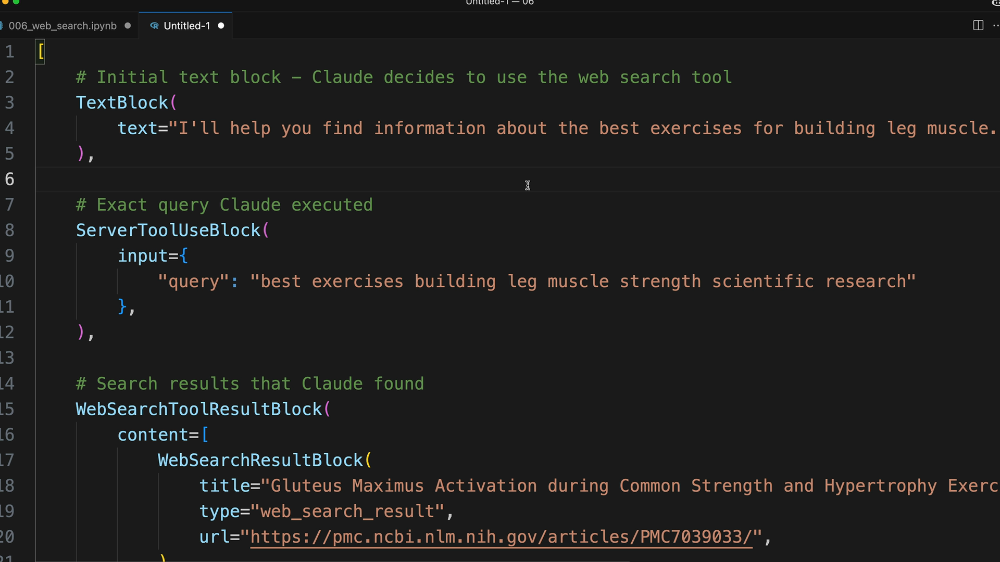

The response structure lets you see exactly what Claude searched for and which sources it found. Citations include the specific text Claude used to support its answers, along with the source URLs.

### Restricting Search Domains

You can limit searches to specific domains using the allowed_domains field. This is particularly useful when you want reliable, authoritative sources:

In [ ]:
web_search_schema = {
    "type": "web_search_20250305",
    "name": "web_search",
    "max_uses": 5,
    "allowed_domains": ["nih.gov"]
}

The different block types in the response are designed for specific UI rendering:

* Render text blocks as regular content
* Display web search results as a list of sources at the top
* Show citations inline with the text, including the source domain, page title, URL, and quoted text